### 原始GAN

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt

%matplotlib inline
import numpy as np

In [2]:
# load data set, need mnist.npz in current work folder
with np.load("resources/mnist.npz", allow_pickle=True) as f:
    train_images, train_labels = f["x_train"], f["y_train"]
    x_test, y_test = f["x_test"], f["y_test"]

In [24]:
(train_images, train_labels),(_, _) = tf.keras.datasets.mnist.load_data()
print(train_images.shape)
# print(train_labels.shape) 输出(60000,) 实际上用不到标签值

(60000, 28, 28)


In [3]:
train_images = tf.expand_dims(train_images, -1)# 或者用 train_labels = train_images.reshape(60000,28,281,1)
print(train_images.shape)

(60000, 28, 28, 1)


2023-11-14 14:30:54.550228: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2023-11-14 14:30:54.550251: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-11-14 14:30:54.550260: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-11-14 14:30:54.550303: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-11-14 14:30:54.550324: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
print(train_images.dtype)
# train_images = train_images.astype('float32') # 把uint8类型转成float32类型 
train_images = tf.cast(train_images, tf.float32)

print(train_images.dtype)
train_images = (train_images - 127.5)/127.5 # 归一化到[-1,1]
print(train_images.shape)

<dtype: 'uint8'>
<dtype: 'float32'>
(60000, 28, 28, 1)


In [5]:
BATCH_SIZE = 64

    BATCH_SIZE就是批次的大小，为64
    BUFFER_SIZE在shuffle(buffer_size)中传入,shuffle就是从数据集中随机抽取buffer_size个数据，再从buffer_size输出其中1个数据项item，item并不只是单单一条真实数据，如果有batch size，则一条数据项item包含了batch size条真实数据。
    一次性拿出60000张图像打乱，然后batch_i取64个 直到把60000张图像取完
    
> https://blog.csdn.net/QLBFA/article/details/108143449

In [6]:
#创建数据集
datasets = tf.data.Dataset.from_tensor_slices(train_images) # 最常用的创建数据集的方法from_tensor_slices，从train_images中创建datasets
print(datasets)

<_TensorSliceDataset element_spec=TensorSpec(shape=(28, 28, 1), dtype=tf.float32, name=None)>


In [7]:
datasets = datasets.shuffle(60000).batch(BATCH_SIZE) # (64, 28, 28)

In [8]:
datasets

<_BatchDataset element_spec=TensorSpec(shape=(None, 28, 28, 1), dtype=tf.float32, name=None)>

### 生成器

In [9]:
def generator_model():
    model = tf.keras.Sequential()
    #输入100，到隐含层1，256个神经元
    model.add(tf.keras.layers.Dense(256, input_shape=(100,), use_bias=False))#输入一个100维的随机向量作为输入
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    #隐含层2，512个神经元
    model.add(tf.keras.layers.Dense(512, use_bias=False))#输入一个100维的随机向量作为输入
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    #输出层是784个神经元
    model.add(tf.keras.layers.Dense(28*28*1, use_bias=False, activation='tanh'))#输入一个100维的随机向量作为输入
    model.add(tf.keras.layers.BatchNormalization())
    
    #把784维的向量，reshape成一张图像，且注意其每一个值都是(-1,1)因为上面用的tanh做激活函数
    model.add(tf.keras.layers.Reshape((28, 28, 1)))
    
    return model

### 判别器

In [10]:
def discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Flatten())#判别器输入是一张图像[28, 28, 1]，所以先flatten成一个向量作为神经元的输入层，连接到后面的隐含层
    
    model.add(tf.keras.layers.Dense(512, use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    model.add(tf.keras.layers.Dense(256, use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    model.add(tf.keras.layers.Dense(1)) # 用sigmoid激活的话就认为<0.5认为不是一张真实的图像，>0.5认为是一张真实的图像,
    # 不用sigmoid激活就认为<0是假的图像，>0是真的图像
    return model

### 损失函数

In [11]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True) #二分类的交叉熵损失

- 解释一下from_logits=True：

        logits表示网络的直接输出，没经过sigmoid或者softmax的概率化。from_logits=False就表示把已经概率化了的输出，重新映射回原值，那么=True就是上面没有经过概率化输出

In [12]:
#判别器的loss
def discriminator_loss(real_out, fake_out): # image_out(64, 1), fake_out(64, 1)
    #判别器的loss有两部分：真实的图像希望能判别为1，生成的图像希望能判别为0
    image_real_loss = cross_entropy(0.9 * tf.ones_like(real_out), real_out) # cross_entropy(y_true, y_pred)
    image_fake_loss = cross_entropy(tf.zeros_like(fake_out), fake_out)
    return image_real_loss + image_fake_loss #整个的loss就是两部分合并起来

In [13]:
#生成器的loss
def generator_loss(fake_out): # fake_out为(64, 1), 就是对64张生成图像的预测结果
#     print("fake_out:",fake_out.shape)
    return cross_entropy(0.9*tf.ones_like(fake_out), fake_out) #希望生成的图像 image_fake被判定为真

In [22]:
# 生成器和判别器是两个模型，所以设置两个分别的优化器
generator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)

### 训练

In [16]:
epochs = 100
noise_dim = 100

nsamples = 20 #每个epoch都生成20个数据看一下生成的效果
z = tf.random.normal([nsamples, noise_dim]) #生成16个随机100维的向量，用这16个随机向量来观察生成的手写数字的情况

In [17]:
generator = generator_model()
discriminator = discriminator_model()

In [18]:
#对一个batch进行训练的函数
@tf.function #加上这句话会训练的特别快
def train_step(images): # 接受一个批次的图像(64, 28, 28, 1)
    noise = tf.random.normal([BATCH_SIZE, noise_dim]) #(64, 100)
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape: #要追踪两个model的梯度
        
        gen_image = generator(noise, training=True)#返回(64,28,28,1)
        
        real_out = discriminator(images, training=True) # 把images(64, 28, 28, 1)送入判别器返回(64,1) 64是64张图像,1是每个图像的返回结果, 因为最后之后一个神经元
        fake_out = discriminator(gen_image, training=True) # 把生成的图像(64,28,28,1),送入判别器得到(64, 1)
        
        # 以上都是为了得到loss, 通过记录loss的获得流程, 最终通过调整参数利用优化器, 降低loss
        gen_loss = generator_loss(fake_out) # 生成器希望让生成图像被判别为真
        disc_loss = discriminator_loss(real_out, fake_out)

    gradient_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)#计算生成器损失和生成器变量之间的梯度
    gradient_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)#计算判别器损失和生成器变量之间的梯度
    
    #更新参数
    generator_optimizer.apply_gradients(zip(gradient_gen, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradient_disc, discriminator.trainable_variables))

In [19]:
def generator_plot_images(gen_model, test_noise): # 传进来的就是 z = tf.random.normal([nsamples, noise_dim]) # (20, 100)
    pred_images = gen_model(test_noise, training=False)
    fig = plt.figure(figsize=(20,1))
#     for i in range(pred_images.shape[0]):
#         plt.subplot(4, 4, i+1)
#         plt.imshow((pred_images[i,:,:,0] + 1) / 2, cmap='gray')
#         plt.axis('off')
    
    for i in range(nsamples): #实际上就是pred_images.shape[0]
        plt.subplot(1, 20, i+1)
        plt.imshow((pred_images[i, :, :, 0] + 1) / 2, cmap='binary') #pred_images是[20,28,28,1]
        plt.axis('off')
    plt.show()#不加这句话就不能在训练的过程中看到生成的结果

In [20]:
# def train(dataset, epochs):
#     for epoch in range(epochs):
#         for i, image_batch in enumerate(dataset):#image_batch就是(256, 28, 28, 1)
#             train_step(image_batch)
#             print("batch_{}/{}".format(i+1, 60000//BATCH_SIZE),end=" ")
#         print("Epoch{}/{}".format(epoch+1, epochs))
#         generator_plot_images(generator, z)

def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:#image_batch就是(256, 28, 28, 1)
            train_step(image_batch)
        print("Epoch{}/{}".format(epoch+1, epochs))
        generator_plot_images(generator, z)

Epoch1/100


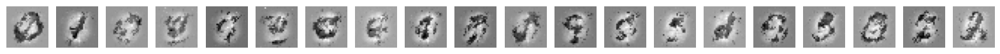

Epoch2/100


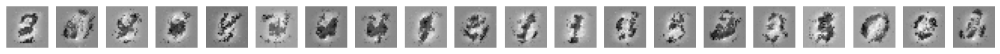

Epoch3/100


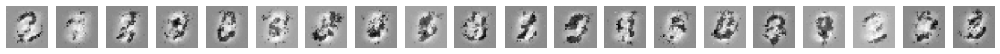

Epoch4/100


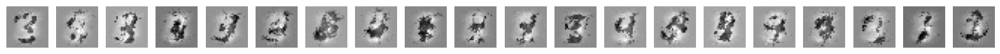

Epoch5/100


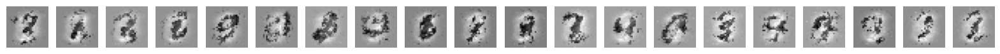

Epoch6/100


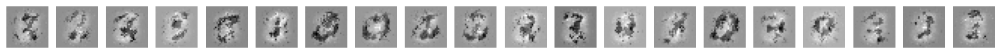

Epoch7/100


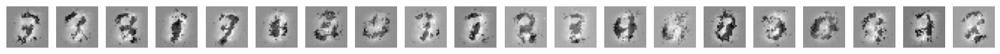

Epoch8/100


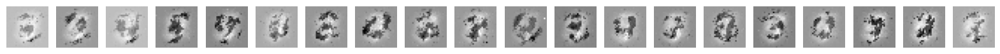

Epoch9/100


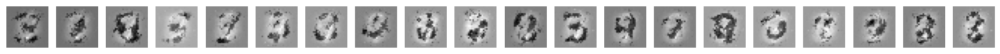

Epoch10/100


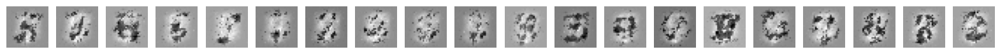

Epoch11/100


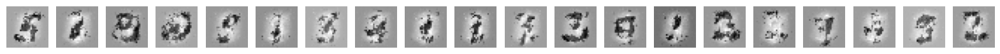

Epoch12/100


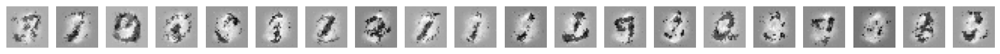

Epoch13/100


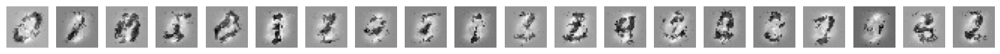

Epoch14/100


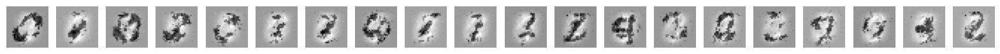

Epoch15/100


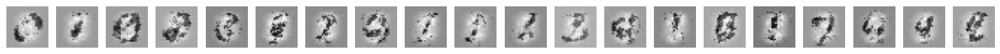

Epoch16/100


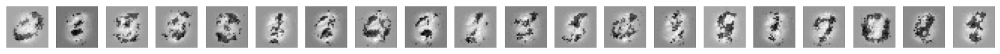

Epoch17/100


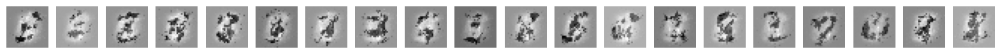

Epoch18/100


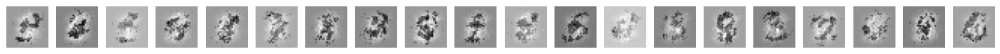

Epoch19/100


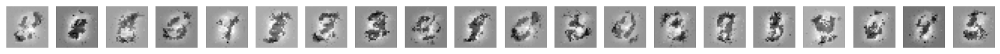

Epoch20/100


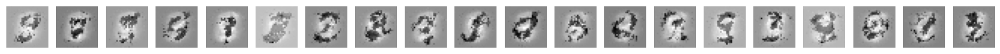

Epoch21/100


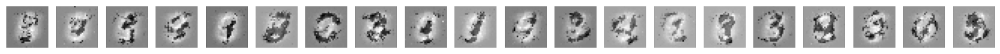

Epoch22/100


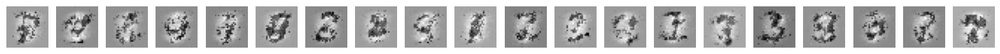

Epoch23/100


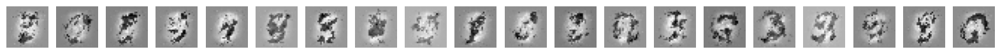

Epoch24/100


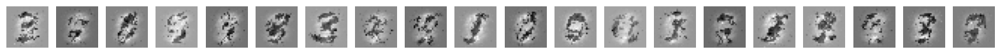

Epoch25/100


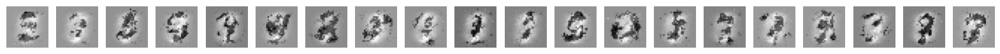

Epoch26/100


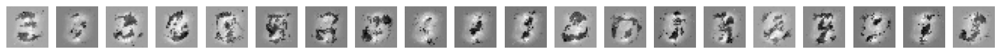

Epoch27/100


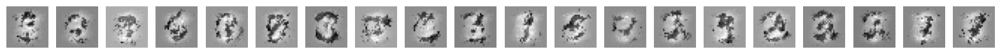

Epoch28/100


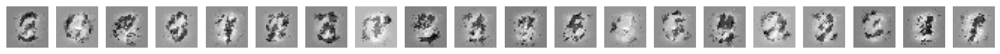

Epoch29/100


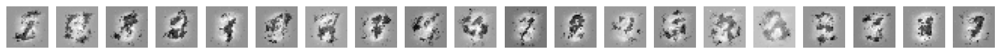

Epoch30/100


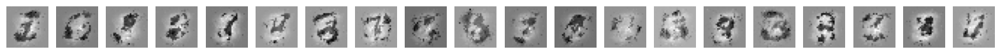

Epoch31/100


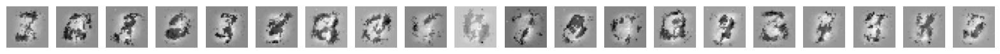

Epoch32/100


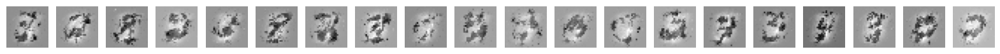

Epoch33/100


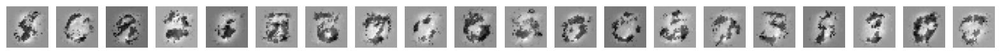

Epoch34/100


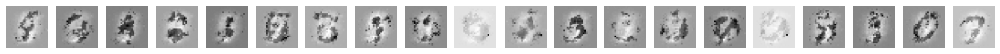

Epoch35/100


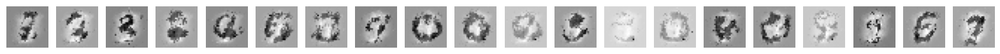

Epoch36/100


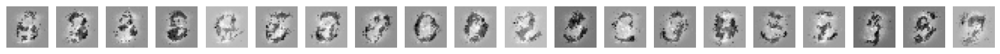

Epoch37/100


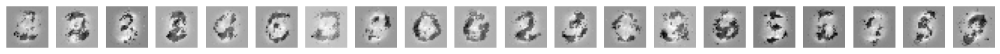

Epoch38/100


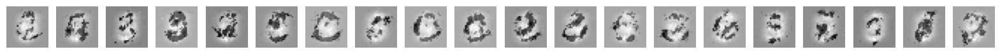

Epoch39/100


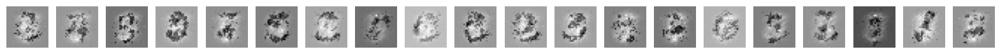

Epoch40/100


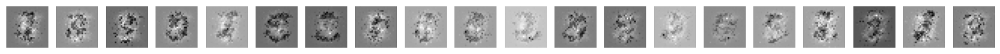

Epoch41/100


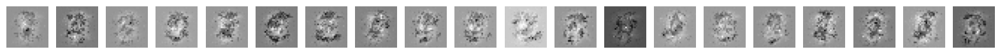

Epoch42/100


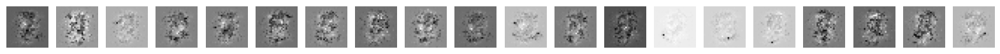

Epoch43/100


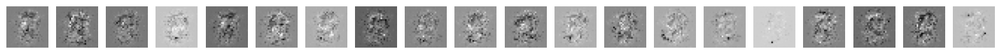

Epoch44/100


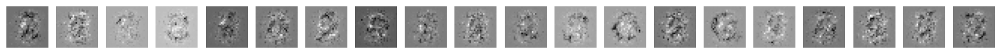

Epoch45/100


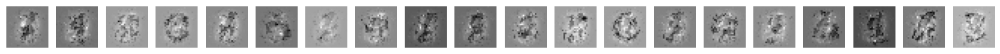

Epoch46/100


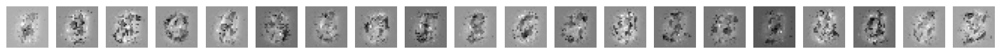

Epoch47/100


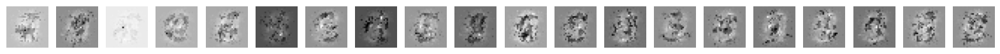

Epoch48/100


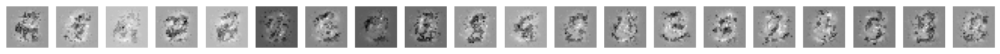

Epoch49/100


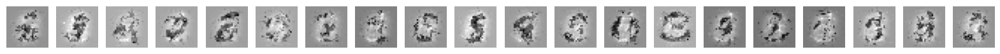

Epoch50/100


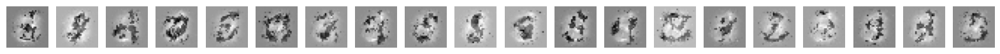

Epoch51/100


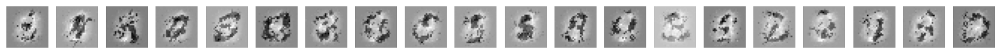

Epoch52/100


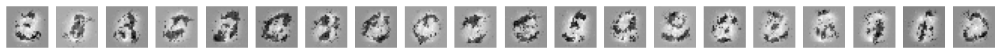

Epoch53/100


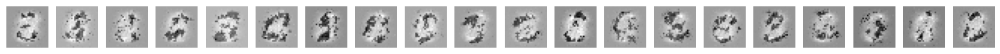

Epoch54/100


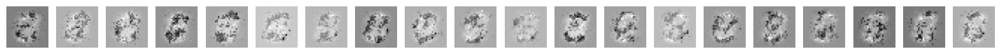

Epoch55/100


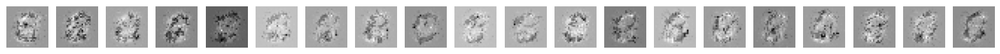

Epoch56/100


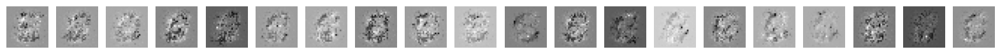

Epoch57/100


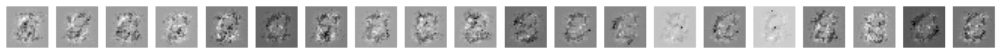

Epoch58/100


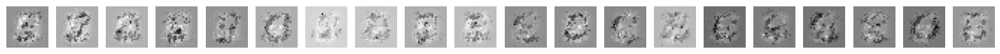

Epoch59/100


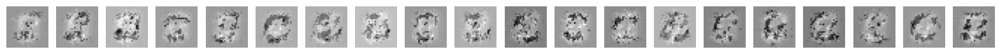

Epoch60/100


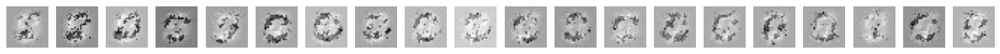

Epoch61/100


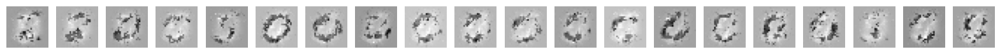

Epoch62/100


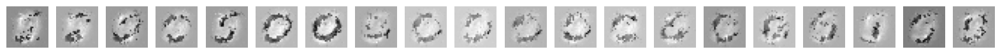

Epoch63/100


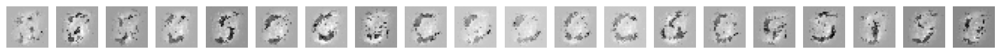

Epoch64/100


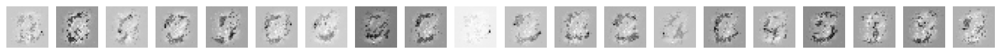

Epoch65/100


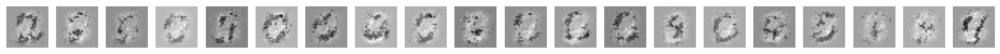

Epoch66/100


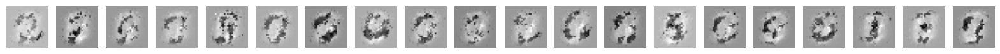

Epoch67/100


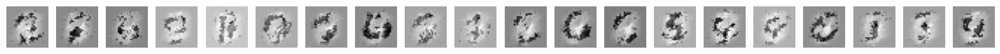

Epoch68/100


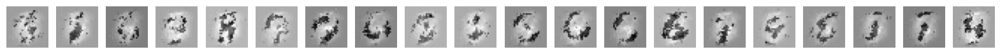

Epoch69/100


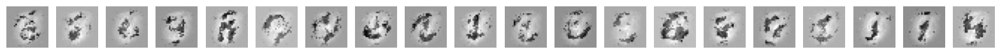

Epoch70/100


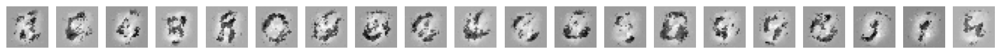

Epoch71/100


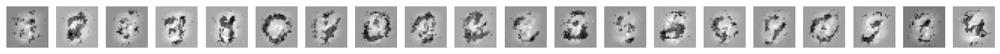

Epoch72/100


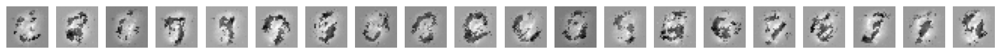

Epoch73/100


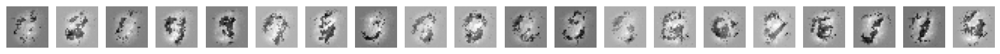

Epoch74/100


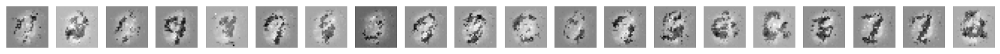

Epoch75/100


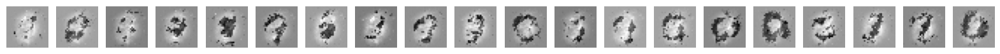

Epoch76/100


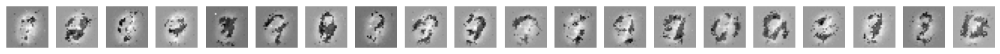

Epoch77/100


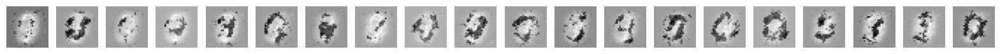

Epoch78/100


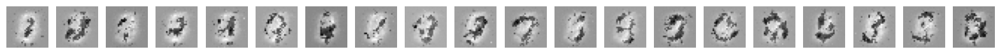

Epoch79/100


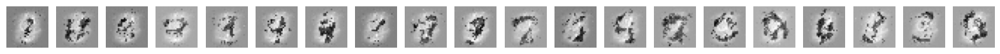

Epoch80/100


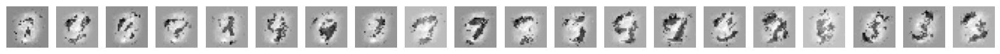

Epoch81/100


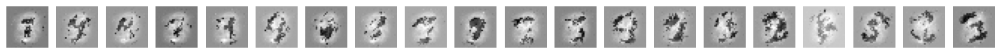

Epoch82/100


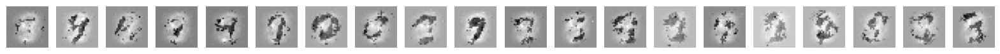

Epoch83/100


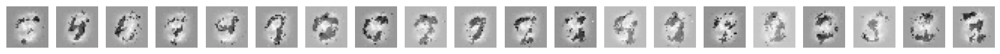

Epoch84/100


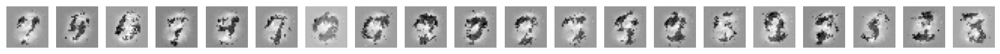

Epoch85/100


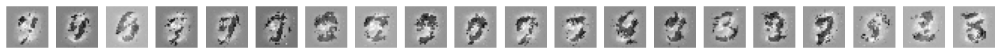

Epoch86/100


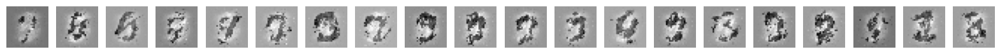

Epoch87/100


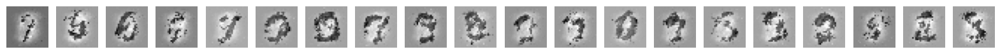

Epoch88/100


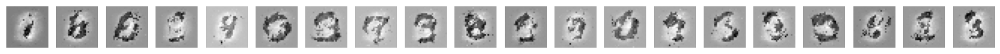

Epoch89/100


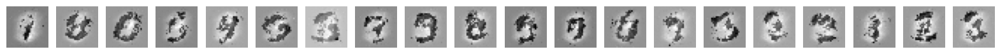

Epoch90/100


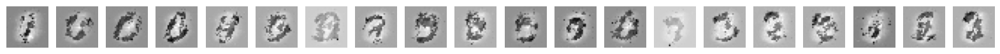

Epoch91/100


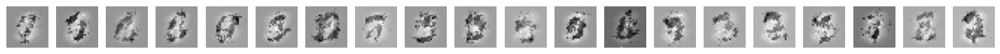

Epoch92/100


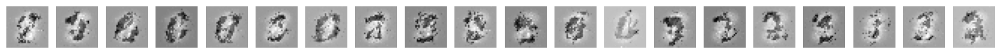

Epoch93/100


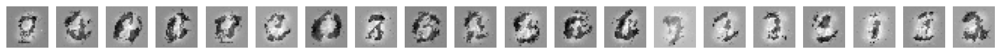

Epoch94/100


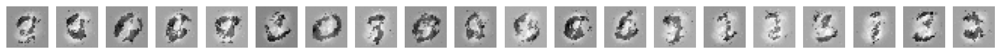

Epoch95/100


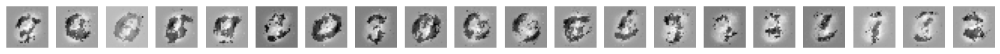

Epoch96/100


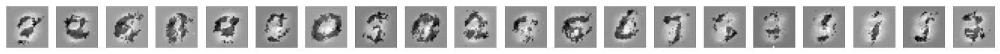

Epoch97/100


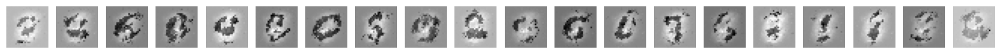

Epoch98/100


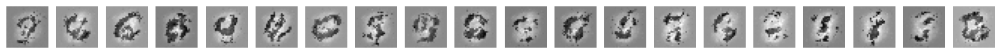

Epoch99/100


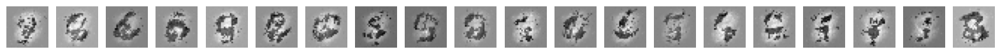

Epoch100/100


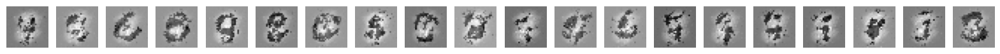

In [23]:
train(datasets, epochs)